In [21]:
import numpy as np
import pandas as pd
import itertools
import shutil
from PIL import Image
import os
import glob
import cv2
import matplotlib.pyplot as plt

import torch
from torch import nn, utils, optim
from torchvision import transforms, models
%matplotlib inline

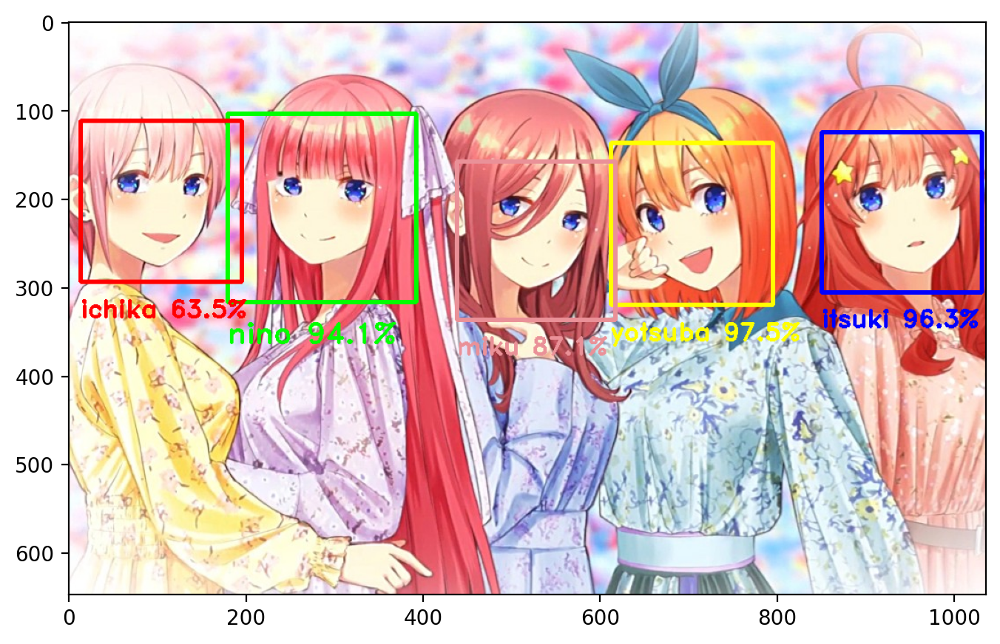

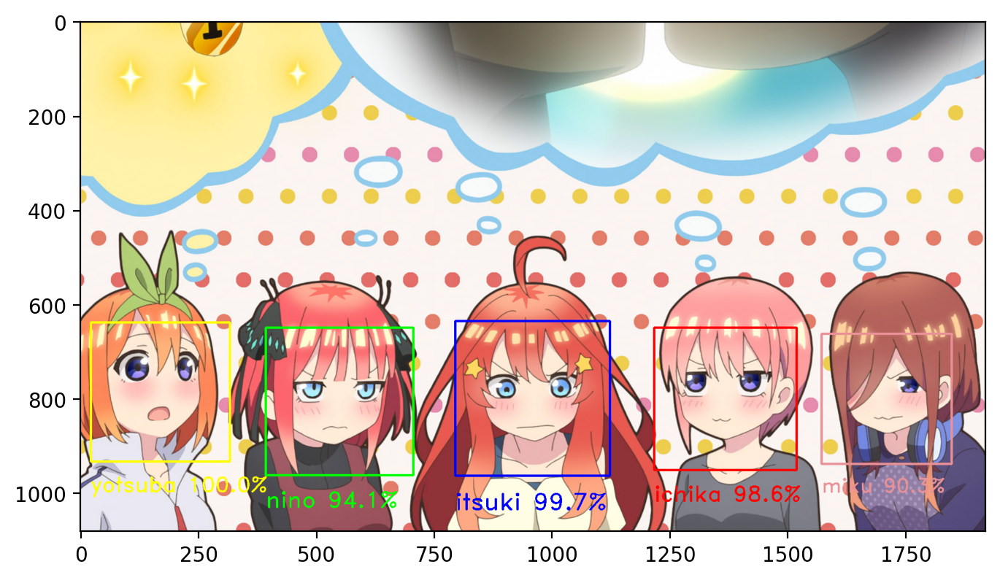

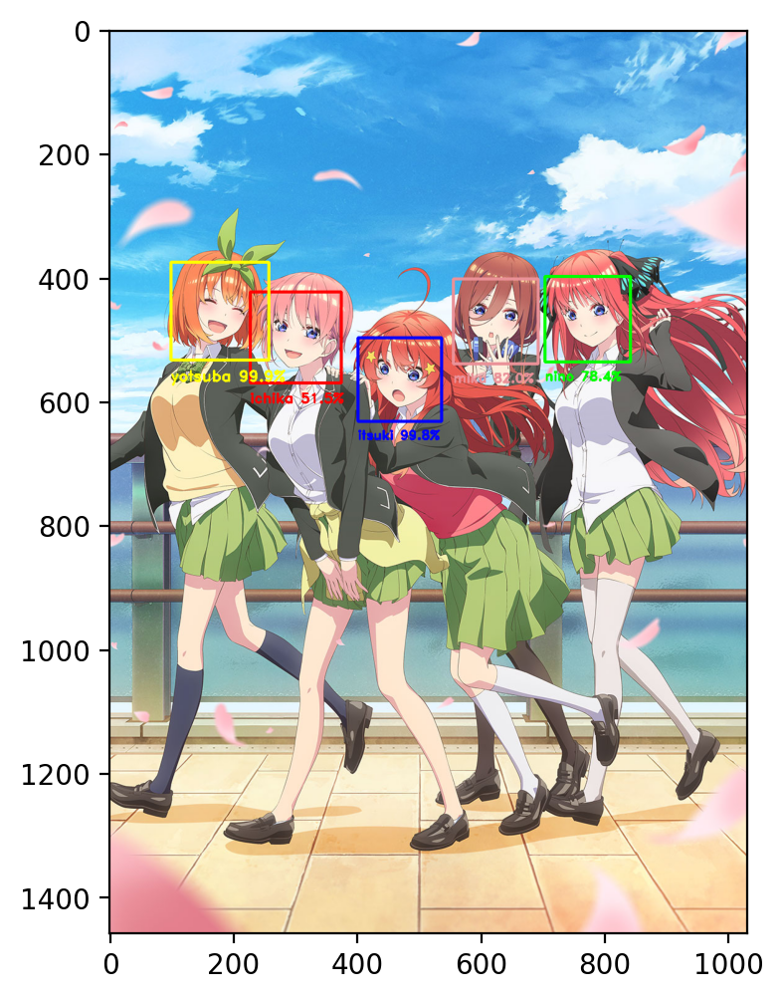

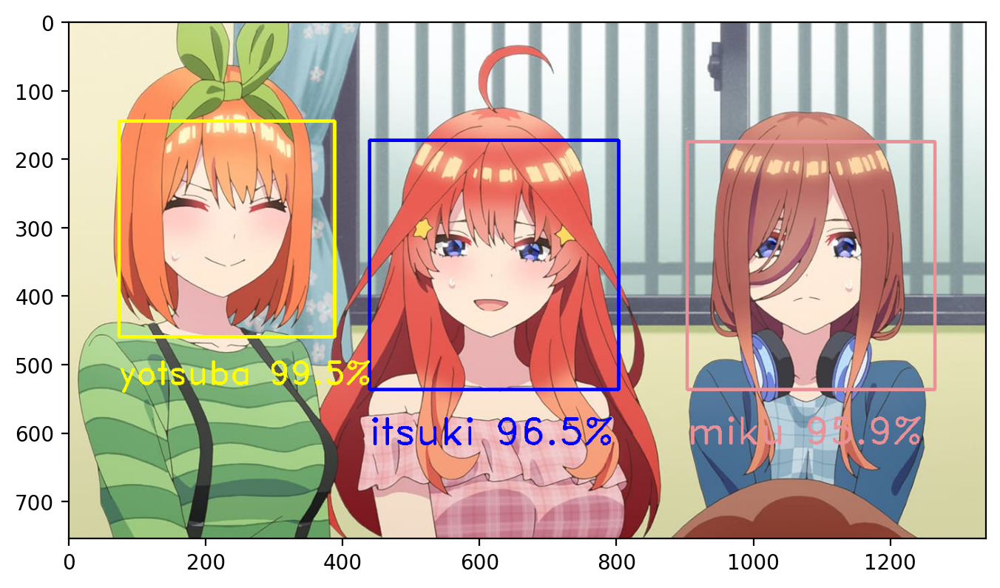

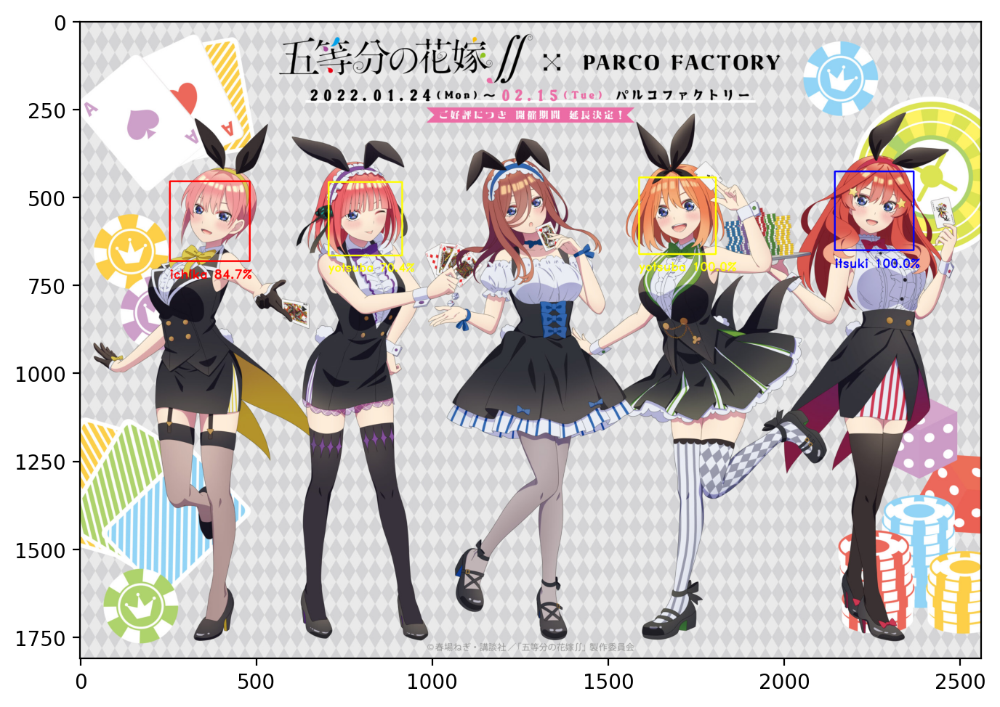

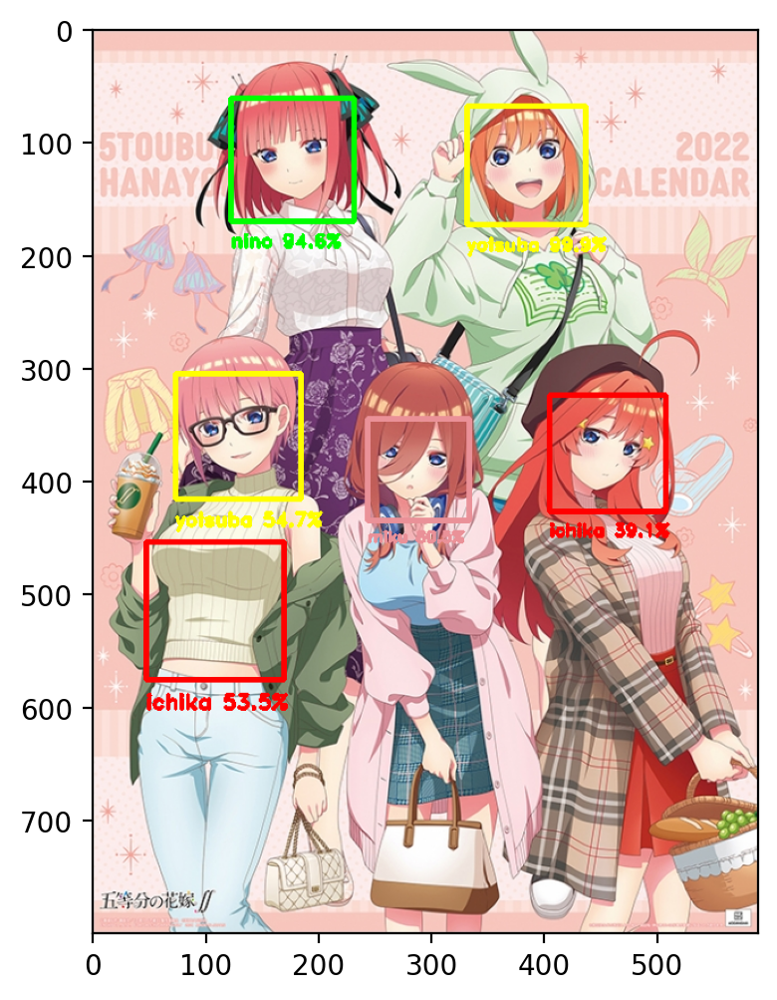

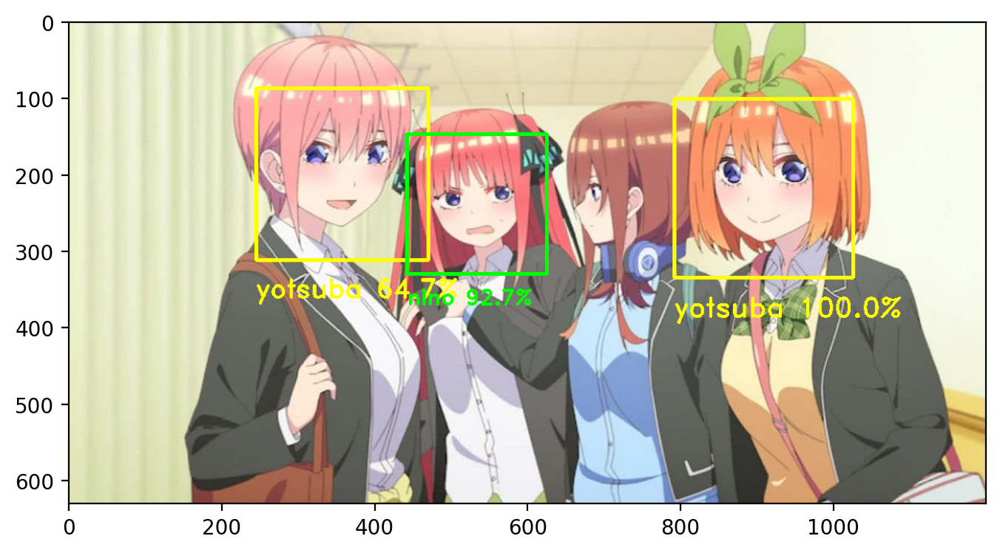

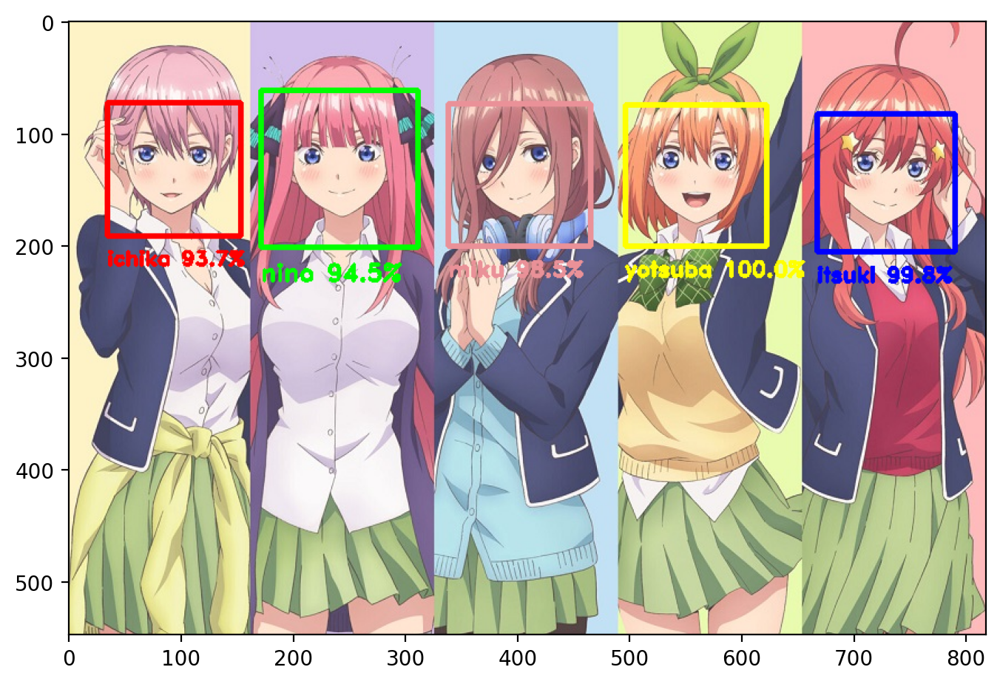

In [27]:
USE_DEVICE = "cuda:0" if torch.cuda.is_available() else "cpu"

model = models.densenet121(pretrained=False)
model = model.to(USE_DEVICE)
num_ftrs = model.classifier.in_features
model.classifier = nn.Linear(num_ftrs, 5).to(USE_DEVICE)
model.load_state_dict(torch.load("gotobunnohanayome/params/model1.pth", map_location=torch.device(USE_DEVICE)))
model.eval()

trans = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225])
    ])
to_tensor_transforms = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((224, 224)),
        transforms.ToTensor()
    ])
    
#datasetの読み込み

#ディレクトリを作成
if not os.path.exists("gotobunnohanayome/result"):
     os.mkdir("gotobunnohanayome/result")
dirname = "gotobunnohanayome/result/"
#適用する画像があるディレクトリを開く
img_path_list = glob.glob("gotobunnohanayome/all/*.jpg")
num = 0
for img_path in img_path_list:
    img = cv2.imread(img_path, 1)
    name,ext = os.path.splitext(img_path)
    num += 1
    file_name = dirname + "pic" +  str(num) + str(ext)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.equalizeHist(gray)
    cascade_path = "lbpcascade_animeface/lbpcascade_animeface.xml"
    cascade = cv2.CascadeClassifier(cascade_path)
    #顔認識を実行
    faces = cascade.detectMultiScale(gray,
                                     # detector options
                                     scaleFactor = 1.1,
                                     minNeighbors = 3,
                                     minSize = (24, 24))
    
    Labels=["ichika", "nino", "miku", "yotsuba", "itsuki"]

    Threshold = 0.95
    #顔が検出されたとき
    if len(faces) > 0:
        for fp in faces:
            # 学習したモデルでスコアを計算する
            img_face = img[fp[1]:fp[1]+fp[3], fp[0]:fp[0]+fp[2]]
            img_face = to_tensor_transforms(img_face)
            img_face = img_face.unsqueeze(dim=0)
            with torch.no_grad():
                img_face = img_face.to(USE_DEVICE)
                output = model(img_face)
                softmax = nn.Softmax(dim=1)
                #print((softmax(output) * 100).max(1)[0])
                output_prob = softmax(output).max(1)[0].item()
                output_label = output.max(1)[1].item()
    
            #閾値以下で表示させない
            #if score[0][score_argmax] < Threshold:
                #continue
            #文字サイズの調整
            fs_rate= 0.005
            text =  "{0} {1:.1f}% ".format(Labels[output_label], output_prob*100)
            #文字を書く座標の調整
            text_rate = 0.22
            #ラベルを色で分ける
            #cv2なのでBGR
            if Labels[output_label] == "ichika":
                cv2.rectangle(img, tuple(fp[0:2]), tuple(fp[0:2]+fp[2:4]), (0, 0, 255), thickness=3)
                cv2.putText(img, text, (fp[0],fp[1]+fp[3]+int(fp[3]*text_rate)),cv2.FONT_HERSHEY_DUPLEX,(fp[3])*fs_rate, (0,0,255), 2)
            if Labels[output_label] == "nino":
                cv2.rectangle(img, tuple(fp[0:2]), tuple(fp[0:2]+fp[2:4]), (0, 255, 0), thickness=3)
                cv2.putText(img, text, (fp[0],fp[1]+fp[3]+int(fp[3]*text_rate)),cv2.FONT_HERSHEY_DUPLEX,(fp[3])*fs_rate, (0,255,0), 2)
            if Labels[output_label] == "miku":
                cv2.rectangle(img, tuple(fp[0:2]), tuple(fp[0:2]+fp[2:4]), (152, 145, 234), thickness=3)
                cv2.putText(img, text, (fp[0],fp[1]+fp[3]+int(fp[3]*text_rate)), cv2.FONT_HERSHEY_DUPLEX, (fp[3])*fs_rate, (152, 145, 234), 2)
            if Labels[output_label] == "yotsuba":
                cv2.rectangle(img, tuple(fp[0:2]), tuple(fp[0:2]+fp[2:4]), (0,255,255), thickness=3)
                cv2.putText(img, text, (fp[0],fp[1]+fp[3]+int(fp[3]*text_rate)), cv2.FONT_HERSHEY_DUPLEX, (fp[3])*fs_rate, (0,255,255), 2)
            if Labels[output_label] == "itsuki":
                cv2.rectangle(img, tuple(fp[0:2]), tuple(fp[0:2]+fp[2:4]),(255,0,0), thickness=3)
                cv2.putText(img, text, (fp[0],fp[1]+fp[3]+int(fp[3]*text_rate)), cv2.FONT_HERSHEY_DUPLEX, (fp[3])*fs_rate, (255,0,0), 2)
        plt.figure(figsize=(8, 6),dpi=200)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.show()
        cv2.imwrite(file_name, img)
        # 顔が検出されなかったとき
    else:
        print("no face")

    

In [28]:
!rm -rf gotobunnohanayome/result